### Load Data

In [1]:
!pip install bb-tools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
from google.colab import drive
drive.mount('/content/drive/')


Mounted at /content/drive/


In [ ]:
!ls drive/MyDrive/SaturdayAI/EEG_project/data/rubert/Rubert_mordida_1/EEG.csv

In [4]:
import pandas as pd

#eeg_file = "../../data/Rubert_14_may/Rubert_mordida_1/EEG.csv"
eeg_file = "drive/MyDrive/SaturdayAI/EEG_project/data/rubert/Rubert_mordida_1/EEG.csv"

df = pd.read_csv(eeg_file)
df.head()

,timestamp,sequence,battery,flags,EEG-ch1,EEG-ch2,EEG-ch3,EEG-ch4,EEG-ch5,EEG-ch6,EEG-ch7,EEG-ch8,EEG-ch9,EEG-ch10,EEG-ch11,EEG-ch12,EEG-ch13,EEG-ch14,EEG-ch15,EEG-ch16
0,153804687683,16336,-2,0,-2553.890054,-6876.865884,31106.838605,214.528663,22527.894451,8132.718209,21134.279463,30553.415250,-10230.794172,-5388.805234,17134.538498,10109.798595,-17322.626756,17221.805220,-10619.150551,9531.200275
1,153804687683,16336,-2,0,-2557.710711,-6880.297175,31105.195966,214.772017,22528.880034,8132.827718,21137.443064,30554.473840,-10229.407054,-5388.087339,17137.081547,10109.774259,-17321.945365,17222.158083,-10620.878364,9531.504468
2,153804687683,16336,-2,0,-2570.961333,-6885.176421,31096.520398,210.002279,22524.438825,8130.528023,21134.948686,30551.626599,-10230.392638,-5389.218935,17135.268560,10101.329878,-17325.364488,17223.642542,-10621.778774,9531.832996
3,153804687683,16336,-2,0,-2585.039358,-6887.330103,31091.774996,201.935096,22518.805181,8127.899801,21129.205533,30548.767190,-10233.677916,-5390.934580,17132.956698,10096.827830,-17330.377579,17223.715548,-10622.642680,9530.056512
4,153804687683,16336,-2,0,-2573.200189,-6886.064663,31095.473976,200.523644,22517.126039,8126.330168,21127.404714,30550.957375,-10236.634666,-5391.761984,17130.401481,10101.926095,-17333.188317,17223.350517,-10622.022128,9527.744649


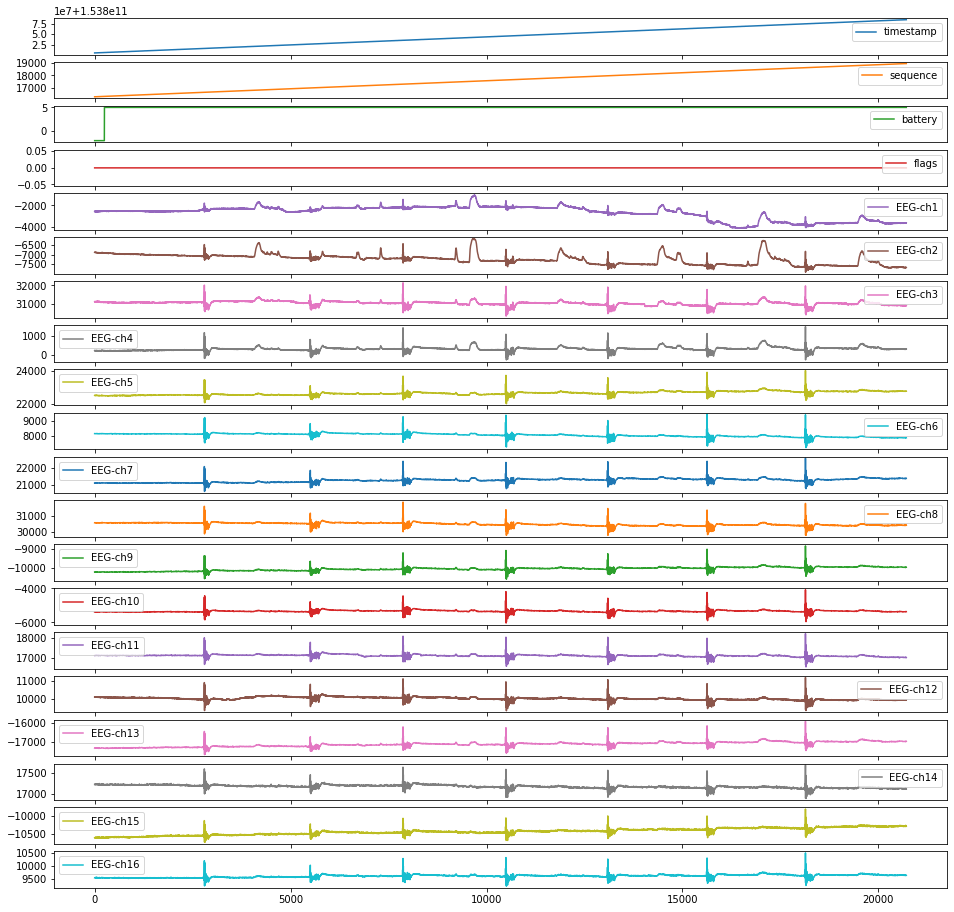

In [5]:
df.plot(subplots=True, figsize=(16, 16));

### Loading Data with BBT functions to operate on Frequency

In [6]:
!pip install mne

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 7.5 MB 4.5 MB/s 


### BBT Functions

In [68]:
import mne
import pandas as pd
import numpy as np
from math import floor


def bbt_read_csv(eeg_csv, channels, sfreq = 256, montage = 'standard_1020', useless_cols = ['timestamp', 'sequence', 'battery', 'flags']):
  df = pd.read_csv(eeg_csv)
  df_mne = df.drop(useless_cols, axis=1)

  # Transpose the matrix because MNE expects it like that
  data_mne = df_mne.to_numpy().transpose()

  # Scale the data
  # data_mne = data_mne / 1000000

  # Create MNE Raw's Info object
  info_mne = mne.create_info(
      #ch_names=list(df_mne.columns),
      ch_names=channels,
      ch_types='eeg',
      sfreq=sfreq)

  bbt_raw = mne.io.RawArray(data_mne, info_mne)
  ten_twenty_montage = mne.channels.make_standard_montage(montage)

  raw = bbt_raw.copy().set_montage(ten_twenty_montage)
  return raw

def high_low_filter_notches(raw, fmin = 0.5, fmax = 100, fnotch = 50.):
  '''Apply High/low filters and notch filters to raw data:
  - raw [mne.io.raw object]: raw data
  - fmin [float]: high pass filter
  - fmax [float]: low pass filter
  '''
  fig = raw.plot_psd(fmin = 0, fmax = fmax + 100, average=False, tmin = 0, tmax = 250)
  
  raw.filter(l_freq = fmin, h_freq = fmax, method = 'iir')
  powerEEG = raw.plot_psd(fmin = 0, fmax = 200, average=False, tmin = 0, tmax = 250)
  timeEEG = raw.plot(start = 0., duration = 250., scalings=0.5e-3, remove_dc=True)
  
  raw.notch_filter(fnotch, fir_design='firwin')
  powerEEG = raw.plot_psd(fmin = 0, fmax = 200, average=False, tmin = 0, tmax = 250)
  timeEEG = raw.plot(start = 0., duration = 250., scalings=0.5e-3, remove_dc=True)
  
  return raw

def interpolate_bat_electrodes(raw, bad_channels_list):
  raw.info['bads'] = bad_channels_list
  
  print('Bad electrodes: ', raw.info['bads'])
  raw.interpolate_bads(reset_bads=False)
  
  return raw

def epochs_around_false_events(raw, event_duration= 1., criteria = 1.3e-4, eventid = 333):
  events = mne.make_fixed_length_events(raw, id = eventid, duration = event_duration)
  
  reject_criteria = dict(eeg = criteria)

  epochs = mne.Epochs(raw, events, event_id = 333, tmin=-0.2, tmax=0.5,
                      reject=reject_criteria, preload=True)

  fig = epochs.plot(scalings=0.5e-4, block=True)
  
  epochs.plot_image()
  
  return epochs

def filters(raw, fmin=0.5, fmax=100., notch=50., sampling_rate=250, fir_design='firwin'):
    '''Apply high/low-pass and notch filters:

        === Args ===
        * raw - mne Raw object: object to apply filters on
        * fmin, fmax - float: bandpass frequencies
        * notch - float: powerline (AC current) frequecy
        * ny_freq - float: Nyquist frequency. Half of the sampling rate
        * fir_design: str: Notch filter type. See mne doc for more details
        * sampling_rate - int, float: sampling rate of the measured data

        === Returns ===
        * raw_c - mne Raw object: Processed Raw copy
        '''
    raw_c = raw.copy()
    raw_c.filter(l_freq=fmin, h_freq=fmax)
    raw_c.notch_filter(np.arange(notch, sampling_rate / 2, notch), fir_design=fir_design)
    return raw_c


def signal_df_to_np(dataframe, chunk_size=100, n_channels=16):
    n_chunks = floor(dataframe.shape[0] / chunk_size)

    windows = np.ndarray(shape=(n_channels, n_chunks, chunk_size), dtype=float)

    channels_array = []
    for i in range(1, n_channels + 1):
        channels_array.append("EEG-ch" + str(i))

    channels_as_pd = dataframe[channels_array].to_numpy()
    # shape --> (samplesChannel, nChannels)

    for iChannel in range(n_channels):
        for iChunk in range(n_chunks):
            for iSample in range(chunk_size):
                idf = (iChunk * chunk_size) + iSample
                windows[iChannel][iChunk][iSample] = channels_as_pd[idf][iChannel]

    # shape --> (channels, windows, samples)
    return windows




def channels_to_list_df_five_sec_window(channels_data, artifact_label):
    # shape --> (channels, windows, samples)

    channels_list_df = []

    for channelData in channels_data:
        channel_data_map = {'label': []}

        for iWindow, window in enumerate(channelData):
            even = (iWindow % 2) == 0
            label = artifact_label if (even and iWindow != 0) else "pause"
            channel_data_map['label'].append(label)

            for iSample, sample in enumerate(window):
                if iSample in channel_data_map:
                    channel_data_map[iSample].append(sample)
                else:
                    channel_data_map[iSample] = [sample]

        channel_data_df = pd.DataFrame(channel_data_map)
        channels_list_df.append(channel_data_df)
        # df.columns = ['window', 'label']

    # array --> df(window, sample) + last column label
    return channels_list_df

def channels_to_list_df_two_and_a_half_sec_window(channels_data, artifact_label):
    # shape --> (channels, windows, samples)

    channels_list_df = []

    for channelData in channels_data:
        channel_data_map = {'label': []}

        for iWindow, window in enumerate(channelData):
            multiple_of_four = (iWindow % 4) == 0
            label = artifact_label if (multiple_of_four and iWindow != 0) else "pause"
            channel_data_map['label'].append(label)

            for iSample, sample in enumerate(window):
                if iSample in channel_data_map:
                    channel_data_map[iSample].append(sample)
                else:
                    channel_data_map[iSample] = [sample]

        channel_data_df = pd.DataFrame(channel_data_map)
        channels_list_df.append(channel_data_df)
        # df.columns = ['window', 'label']

    # array --> df(window, sample) + last column label
    return channels_list_df


In [13]:
#import bbtools as bbt

raw_rubert = bbt_read_csv(eeg_file,
                        ['Fp1', 'Fp2', 'F3', 'F4', 'C1', 'C3', 'C2', 'C4', 'CP1', 'CP3', 'CP2', 'CP4', 'Cz', 'O1', 'O2', 'Pz'])

Creating RawArray with float64 data, n_channels=16, n_times=20712
    Range : 0 ... 20711 =      0.000 ...    80.902 secs
Ready.


Effective window size : 8.000 (s)


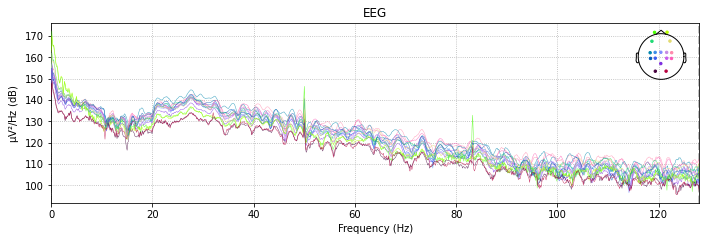

In [14]:
plot_raw = raw_rubert.plot_psd(fmin = 0, fmax = 128, average=False, tmin = 0, tmax = 120)
#plot_raw = raw_rubert.plot_psd(fmin = 0, fmax = 128, average=True, tmin = 0, tmax = 120)
#plot_raw = raw_rubert.plot_psd()

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 1e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 25.00 Hz (-6 dB cutoff frequency: 112.50 Hz)
- Filter length: 1691 samples (6.605 sec)

Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 1691 samples (6.605 sec)

Effective window size : 8.000 (s)


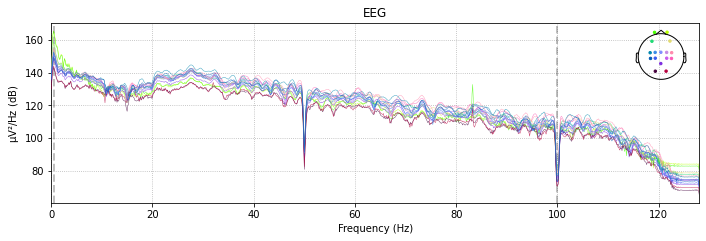

In [15]:
filtered_rubert = filters(raw_rubert)
plot_filtered = filtered_rubert.plot_psd(fmin = 0, fmax = 128, average=False, tmin = 0, tmax = 120)

In [16]:
#save_path = '../../data/pickle/'
save_path = 'drive/MyDrive/SaturdayAI/EEG_project/data/pickle/'

df.to_pickle(save_path + 'rubert_jaw_1.pkl')

### Slicing into smaller temporal windows

In [78]:
#import bbtools as bbt

sampling_rate = 256
window_time = 5 # segs
window_size = window_time * sampling_rate
n_channels = 16

channelsData = signal_df_to_np(df, window_size, n_channels)

print("---SHAPE---")
print(channelsData.shape)
print("---DATA---")
print(channelsData)

---SHAPE---
(16, 16, 1280)
---DATA---
[[[ -2553.89005386  -2557.71071067  -2570.96133251 ...  -2558.12441236
    -2568.63730241  -2559.62103907]
  [ -2535.57767015  -2521.2076202   -2535.93053335 ...  -2499.28143052
    -2517.66682042  -2524.85792924]
  [ -2511.40045656  -2507.89615987  -2526.30588517 ...  -2285.31248189
    -2305.04848614  -2305.1823308 ]
  ...
  [ -4048.19273299  -4040.22289157  -4028.51756723 ...  -3763.73631667
    -3773.33662946  -3779.2988009 ]
  [ -3777.70483262  -3765.57363889  -3754.53753787 ...  -3616.27599887
    -3623.23592145  -3635.00208428]
  [ -3641.25628045  -3631.43694911  -3628.61404345 ...  -3642.49738552
    -3651.84217668  -3661.90486195]]

 [[ -6876.86588421  -6880.29717471  -6885.17642114 ...  -7008.84889165
    -7008.82455625  -6998.03180917]
  [ -6991.30307283  -6988.02996238  -6993.05522117 ...  -7069.37101565
    -7073.43502638  -7073.34985251]
  [ -7073.53236796  -7073.64187723  -7075.79555957 ...  -7088.51080275
    -7093.6820739   -7091.6

---SHAPE---
(16, 8, 2560)
---DATA---


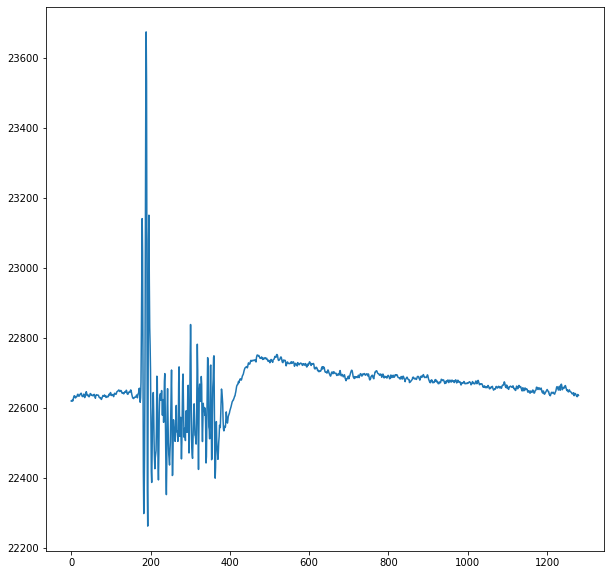

In [79]:
import matplotlib.pyplot as plt

channel = channelsData[4]
# shape (windows, samples)

# Data sequence
# pause pause signal pause ...

window = channel[6]

plt.figure(figsize=(10,10))
plt.plot(window)
plt.show()

In [ ]:
# Funcion para visualizar las ventanas a ver si caen correctamente en un spike:
def print_windows(allChannelsData):
  print("printing windows")
  for idChannel, channel in enumerate(allChannelsData):
    print(f"------------channel {idChannel} -------------")
    for idWindow, window in enumerate(channel):
      plt.figure(figsize=(4,4))
      plt.title(f"window {idWindow} from channel {idChannel}")
      plt.plot(window)
    

print_windows(channelsData)

### Labeling data

In [30]:
channels_list_df = channels_to_list_df_five_sec_window(channelsData, 'jaw')

channel = channels_list_df[0]
channel.head(n_channels)   

,label,0,1,2,3,4,5,6,7,8,...,1270,1271,1272,1273,1274,1275,1276,1277,1278,1279
0,pause,-2553.890054,-2557.710711,-2570.961333,-2585.039358,-2573.200189,-2554.632283,-2559.548033,-2570.936997,-2576.010927,...,-2528.848934,-2529.408648,-2541.661519,-2553.379011,-2545.749865,-2528.702921,-2536.113049,-2558.124412,-2568.637302,-2559.621039
1,pause,-2535.577670,-2521.207620,-2535.930533,-2555.058153,-2549.485348,-2540.688103,-2537.062129,-2544.520927,-2560.229424,...,-2494.073656,-2490.703204,-2505.778981,-2518.810584,-2508.236855,-2495.521612,-2491.834800,-2499.281431,-2517.666820,-2524.857929
2,jaw,-2511.400457,-2507.896160,-2526.305885,-2534.044540,-2521.742999,-2501.374274,-2485.483262,-2494.840221,-2520.368049,...,-2290.009213,-2281.650005,-2293.537845,-2302.079568,-2299.633861,-2290.885287,-2278.827099,-2285.312482,-2305.048486,-2305.182331
3,pause,-2290.094387,-2286.371072,-2290.532424,-2306.277424,-2316.242767,-2302.262084,-2283.609004,-2288.792443,-2302.067400,...,-2595.673925,-2584.017271,-2585.258376,-2592.096622,-2598.934868,-2588.872182,-2571.350699,-2576.375958,-2591.634249,-2596.951533
4,jaw,-2594.213801,-2584.929848,-2581.486390,-2598.630675,-2614.217495,-2604.909207,-2594.761347,-2590.928523,-2594.469323,...,-2226.615512,-2212.902518,-2205.090857,-2219.801602,-2240.231165,-2231.579933,-2218.426652,-2217.258554,-2223.293731,-2236.666030
5,pause,-2236.653862,-2215.968778,-2204.750161,-2214.800679,-2224.778190,-2226.469500,-2220.507329,-2209.933600,-2214.788511,...,-2216.808349,-2201.781243,-2194.760482,-2208.668160,-2220.312645,-2217.842603,-2205.468055,-2191.414366,-2188.408944,-2200.272449
6,jaw,-2195.721730,-2172.250243,-2159.778354,-2163.258315,-2176.046564,-2186.097082,-2178.370595,-2166.811283,-2177.786545,...,-2196.950668,-2180.414768,-2182.337264,-2194.358948,-2202.438299,-2202.888504,-2190.964161,-2176.107403,-2186.352604,-2202.207113
7,pause,-2200.990343,-2189.212012,-2179.769880,-2180.706792,-2193.604551,-2195.527047,-2172.578771,-2154.436735,-2157.855858,...,-2112.774541,-2103.393247,-2100.813695,-2103.125557,-2114.952559,-2119.770967,-2103.393247,-2091.468904,-2101.701937,-2112.652864
8,jaw,-2113.638447,-2105.668606,-2094.389151,-2097.625758,-2115.195913,-2119.941314,-2102.663185,-2091.371562,-2090.264302,...,-2240.790879,-2231.227070,-2220.409987,-2226.591177,-2247.008572,-2247.689963,-2231.068889,-2223.220725,-2228.331158,-2236.751204
9,pause,-2240.425848,-2226.286985,-2208.193619,-2213.279717,-2228.014798,-2232.054473,-2225.715103,-2218.597000,-2215.980945,...,-2568.637302,-2556.615618,-2542.367245,-2548.755286,-2562.200591,-2553.403346,-2534.336565,-2522.387887,-2519.212118,-2533.910696


In [31]:
for channel_df in channels_list_df:
    channel_df['label'] = channel_df['label'].replace({'pause': 0, 'jaw': 1})

selected_channel = 3

channel = channels_list_df[selected_channel] #solo el canal seleccionado

print(channel.shape)

channel.head(n_channels)

(16, 1281)


,label,0,1,2,3,4,5,6,7,8,...,1270,1271,1272,1273,1274,1275,1276,1277,1278,1279
0,0,-2553.890054,-2557.710711,-2570.961333,-2585.039358,-2573.200189,-2554.632283,-2559.548033,-2570.936997,-2576.010927,...,-2528.848934,-2529.408648,-2541.661519,-2553.379011,-2545.749865,-2528.702921,-2536.113049,-2558.124412,-2568.637302,-2559.621039
1,0,-2535.577670,-2521.207620,-2535.930533,-2555.058153,-2549.485348,-2540.688103,-2537.062129,-2544.520927,-2560.229424,...,-2494.073656,-2490.703204,-2505.778981,-2518.810584,-2508.236855,-2495.521612,-2491.834800,-2499.281431,-2517.666820,-2524.857929
2,1,-2511.400457,-2507.896160,-2526.305885,-2534.044540,-2521.742999,-2501.374274,-2485.483262,-2494.840221,-2520.368049,...,-2290.009213,-2281.650005,-2293.537845,-2302.079568,-2299.633861,-2290.885287,-2278.827099,-2285.312482,-2305.048486,-2305.182331
3,0,-2290.094387,-2286.371072,-2290.532424,-2306.277424,-2316.242767,-2302.262084,-2283.609004,-2288.792443,-2302.067400,...,-2595.673925,-2584.017271,-2585.258376,-2592.096622,-2598.934868,-2588.872182,-2571.350699,-2576.375958,-2591.634249,-2596.951533
4,1,-2594.213801,-2584.929848,-2581.486390,-2598.630675,-2614.217495,-2604.909207,-2594.761347,-2590.928523,-2594.469323,...,-2226.615512,-2212.902518,-2205.090857,-2219.801602,-2240.231165,-2231.579933,-2218.426652,-2217.258554,-2223.293731,-2236.666030
5,0,-2236.653862,-2215.968778,-2204.750161,-2214.800679,-2224.778190,-2226.469500,-2220.507329,-2209.933600,-2214.788511,...,-2216.808349,-2201.781243,-2194.760482,-2208.668160,-2220.312645,-2217.842603,-2205.468055,-2191.414366,-2188.408944,-2200.272449
6,1,-2195.721730,-2172.250243,-2159.778354,-2163.258315,-2176.046564,-2186.097082,-2178.370595,-2166.811283,-2177.786545,...,-2196.950668,-2180.414768,-2182.337264,-2194.358948,-2202.438299,-2202.888504,-2190.964161,-2176.107403,-2186.352604,-2202.207113
7,0,-2200.990343,-2189.212012,-2179.769880,-2180.706792,-2193.604551,-2195.527047,-2172.578771,-2154.436735,-2157.855858,...,-2112.774541,-2103.393247,-2100.813695,-2103.125557,-2114.952559,-2119.770967,-2103.393247,-2091.468904,-2101.701937,-2112.652864
8,1,-2113.638447,-2105.668606,-2094.389151,-2097.625758,-2115.195913,-2119.941314,-2102.663185,-2091.371562,-2090.264302,...,-2240.790879,-2231.227070,-2220.409987,-2226.591177,-2247.008572,-2247.689963,-2231.068889,-2223.220725,-2228.331158,-2236.751204
9,0,-2240.425848,-2226.286985,-2208.193619,-2213.279717,-2228.014798,-2232.054473,-2225.715103,-2218.597000,-2215.980945,...,-2568.637302,-2556.615618,-2542.367245,-2548.755286,-2562.200591,-2553.403346,-2534.336565,-2522.387887,-2519.212118,-2533.910696


In [32]:
channel = channels_list_df[0]

Y = channel_df['label']
Y.head()

0    0
1    0
2    1
3    0
4    1
Name: label, dtype: int64

In [33]:
X = channel.drop(['label'], axis=1)
X.head()

,0,1,2,3,4,5,6,7,8,9,...,1270,1271,1272,1273,1274,1275,1276,1277,1278,1279
0,-2553.890054,-2557.710711,-2570.961333,-2585.039358,-2573.200189,-2554.632283,-2559.548033,-2570.936997,-2576.010927,-2569.489041,...,-2528.848934,-2529.408648,-2541.661519,-2553.379011,-2545.749865,-2528.702921,-2536.113049,-2558.124412,-2568.637302,-2559.621039
1,-2535.577670,-2521.207620,-2535.930533,-2555.058153,-2549.485348,-2540.688103,-2537.062129,-2544.520927,-2560.229424,-2560.059076,...,-2494.073656,-2490.703204,-2505.778981,-2518.810584,-2508.236855,-2495.521612,-2491.834800,-2499.281431,-2517.666820,-2524.857929
2,-2511.400457,-2507.896160,-2526.305885,-2534.044540,-2521.742999,-2501.374274,-2485.483262,-2494.840221,-2520.368049,-2526.293717,...,-2290.009213,-2281.650005,-2293.537845,-2302.079568,-2299.633861,-2290.885287,-2278.827099,-2285.312482,-2305.048486,-2305.182331
3,-2290.094387,-2286.371072,-2290.532424,-2306.277424,-2316.242767,-2302.262084,-2283.609004,-2288.792443,-2302.067400,-2307.786218,...,-2595.673925,-2584.017271,-2585.258376,-2592.096622,-2598.934868,-2588.872182,-2571.350699,-2576.375958,-2591.634249,-2596.951533
4,-2594.213801,-2584.929848,-2581.486390,-2598.630675,-2614.217495,-2604.909207,-2594.761347,-2590.928523,-2594.469323,-2601.636096,...,-2226.615512,-2212.902518,-2205.090857,-2219.801602,-2240.231165,-2231.579933,-2218.426652,-2217.258554,-2223.293731,-2236.666030


In [34]:
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression

seed = 1234

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, Y, test_size=0.25, shuffle=True,random_state=seed)

X_train.head()

,0,1,2,3,4,5,6,7,8,9,...,1270,1271,1272,1273,1274,1275,1276,1277,1278,1279
14,-3777.704833,-3765.573639,-3754.537538,-3767.995011,-3788.704431,-3787.378152,-3776.548901,-3770.465053,-3774.078859,-3790.505250,...,-3639.126934,-3625.730299,-3619.390929,-3630.998912,-3644.273869,-3633.992165,-3616.519353,-3616.275999,-3623.235921,-3635.002084
2,-2511.400457,-2507.896160,-2526.305885,-2534.044540,-2521.742999,-2501.374274,-2485.483262,-2494.840221,-2520.368049,-2526.293717,...,-2290.009213,-2281.650005,-2293.537845,-2302.079568,-2299.633861,-2290.885287,-2278.827099,-2285.312482,-2305.048486,-2305.182331
10,-2546.078393,-2539.081967,-2535.723683,-2552.758458,-2569.720227,-2579.685571,-2575.451213,-2561.811224,-2565.485869,-2583.323712,...,-2795.272823,-2780.659420,-2771.144281,-2785.100629,-2797.024972,-2797.840207,-2791.354825,-2779.892855,-2784.090710,-2802.086734
7,-2200.990343,-2189.212012,-2179.769880,-2180.706792,-2193.604551,-2195.527047,-2172.578771,-2154.436735,-2157.855858,-2168.782449,...,-2112.774541,-2103.393247,-2100.813695,-2103.125557,-2114.952559,-2119.770967,-2103.393247,-2091.468904,-2101.701937,-2112.652864
1,-2535.577670,-2521.207620,-2535.930533,-2555.058153,-2549.485348,-2540.688103,-2537.062129,-2544.520927,-2560.229424,-2560.059076,...,-2494.073656,-2490.703204,-2505.778981,-2518.810584,-2508.236855,-2495.521612,-2491.834800,-2499.281431,-2517.666820,-2524.857929


In [35]:
from sklearn.model_selection import GridSearchCV

lr_params = {'C': [9.08, 10.08, 100.08,200.08],
             'max_iter': [100,200, 500, 1000,50000,100000]}

lr_grid = GridSearchCV(estimator=LogisticRegression(random_state=seed),
                       param_grid=lr_params,
                       cv=3).fit(X_train, y_train)

lr_grid.best_estimator_.get_params()

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


{'C': 9.08,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 1234,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [36]:
lr_opt = LogisticRegression(C=9.08, max_iter=100, penalty='l2', random_state=seed)
stats = lr_opt.fit(X_train, y_train)
score = lr_opt.score(X_test, y_test)

print("--stats--")
print(stats)
print("--score--")
print(score)

--stats--
LogisticRegression(C=9.08, random_state=1234)
--score--
0.75


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


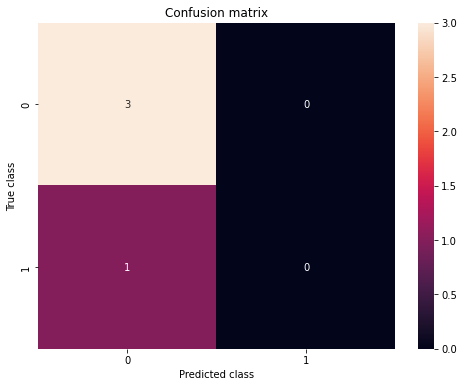

In [37]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred_lr = lr_opt.predict(X_test)

conf_matrix = confusion_matrix(y_test, y_pred_lr, labels=[0, 1])
plt.figure(figsize=[8, 6])
sns.heatmap(conf_matrix,
            annot=True,
            fmt='d')
plt.title('Confusion matrix')
plt.ylabel('True class')
plt.xlabel('Predicted class');

In [38]:
import numpy as np

n_channel = 3
test_channel = channels_list_df[n_channel]
test_no_label = test_channel.drop(['label'], axis=1)
#n_window = 4
#test_window = np.array(test_no_label.iloc[n_window]).reshape(1, 1280)
test_window = test_no_label

print(test_window.shape)

# other channel, window with label to test predict label 1 (jaw)
lr_opt.predict(test_window)

(16, 1280)


array([1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0])

In [40]:
import pickle

# Saving model
filename = '../../models/channel'+ str(n_channel) + '_regression.sav'
#pickle.dump(lr_opt, open(filename, 'wb'))

## Ahora vamos a hacer todo el proceso con ventanas de 2,5 segundos

In [83]:
# vamos a probar a enventanar con un windows size menor (2,5 segundos)
# y a continuacion visualizar las ventanas a ver si no se cortan las señales que nos interesan
# para tiempo real cuanto menor sea la ventana mejor, pero si nos pasamos nos cargamos la señal

sampling_rate = 256
window_time = 2.5 # segs
window_size = int(window_time * sampling_rate)
n_channels = 16

channelsDataReducedWindow = signal_df_to_np(df, window_size, n_channels)
channelsDataReducedWindow.shape

(16, 32, 640)

printing windows
------------channel 0 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 1 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 2 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 3 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 4 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 5 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 6 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 7 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 8 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 9 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 10 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 11 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 12 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 13 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 14 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

------------channel 15 -------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see th

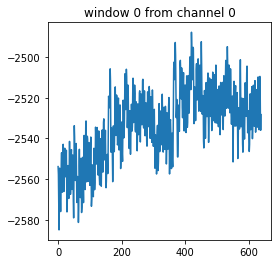

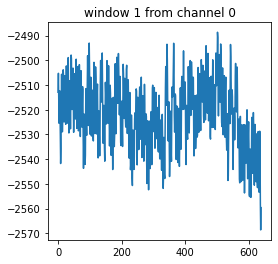

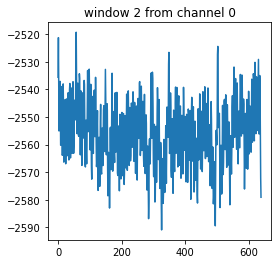

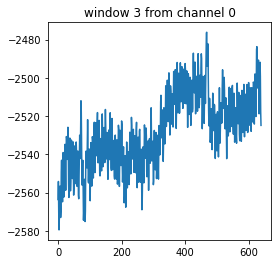

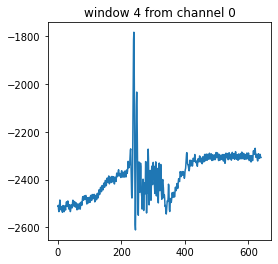

...

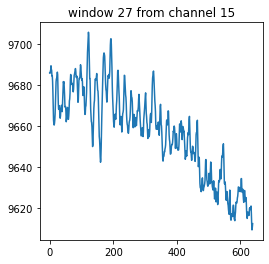

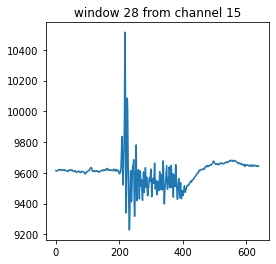

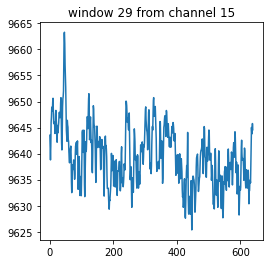

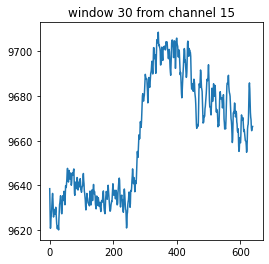

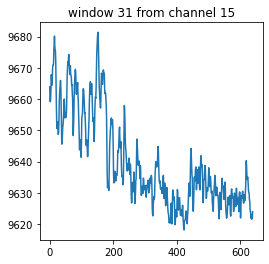

In [84]:
# Imprimimos las ventanas para comprobar visualmente que los spikes de los jaws
# caen en ventanas multiplos de 4
print_windows(channelsDataReducedWindow)

In [87]:
channelsDataReducedWindow[0].shape

(32, 640)

In [89]:
# generamos un dataframe con las etiquetas donde las ventanas son mas pequeñas. (2,5 segundos)
# nos puede ayudar a que el modelo sea mejor ya que la señal está más acotada y tenemos mas ejemplos de ruido

channels_list_df_little_windows = channels_to_list_df_two_and_a_half_sec_window(channelsDataReducedWindow, 'jaw')
channel = channels_list_df_little_windows[0]

print(len(channels_list_df_little_windows))
print(channel.shape)

channel.head(32)   


16
(32, 641)


,label,0,1,2,3,4,5,6,7,8,...,630,631,632,633,634,635,636,637,638,639
0,pause,-2553.890054,-2557.710711,-2570.961333,-2585.039358,-2573.200189,-2554.632283,-2559.548033,-2570.936997,-2576.010927,...,-2509.794321,-2515.330623,-2526.038196,-2535.784521,-2527.875518,-2509.599637,-2509.563134,-2527.169792,-2536.003540,-2528.325723
1,pause,-2512.945754,-2505.280105,-2514.515387,-2525.478482,-2519.126944,-2512.361705,-2520.027354,-2530.199548,-2541.783196,...,-2528.848934,-2529.408648,-2541.661519,-2553.379011,-2545.749865,-2528.702921,-2536.113049,-2558.124412,-2568.637302,-2559.621039
2,pause,-2535.577670,-2521.207620,-2535.930533,-2555.058153,-2549.485348,-2540.688103,-2537.062129,-2544.520927,-2560.229424,...,-2536.417241,-2529.104455,-2541.211314,-2556.153245,-2547.039641,-2534.944950,-2540.505587,-2555.751711,-2572.190270,-2579.101522
3,pause,-2563.660714,-2554.206414,-2570.219103,-2579.551726,-2573.102847,-2565.291186,-2556.615618,-2559.548033,-2573.066344,...,-2494.073656,-2490.703204,-2505.778981,-2518.810584,-2508.236855,-2495.521612,-2491.834800,-2499.281431,-2517.666820,-2524.857929
4,jaw,-2511.400457,-2507.896160,-2526.305885,-2534.044540,-2521.742999,-2501.374274,-2485.483262,-2494.840221,-2520.368049,...,-2304.208915,-2291.749194,-2302.116071,-2311.643378,-2308.053907,-2301.519854,-2293.963714,-2296.518931,-2308.564951,-2307.761883
5,pause,-2289.339990,-2283.852358,-2295.289993,-2307.932230,-2318.347779,-2309.720882,-2296.762285,-2305.547362,-2321.730398,...,-2290.009213,-2281.650005,-2293.537845,-2302.079568,-2299.633861,-2290.885287,-2278.827099,-2285.312482,-2305.048486,-2305.182331
6,pause,-2290.094387,-2286.371072,-2290.532424,-2306.277424,-2316.242767,-2302.262084,-2283.609004,-2288.792443,-2302.067400,...,-2276.892436,-2264.882919,-2274.166872,-2283.718514,-2286.821276,-2279.423317,-2265.783328,-2271.477811,-2287.697350,-2291.384163
7,pause,-2282.063707,-2276.040697,-2275.480983,-2288.865449,-2301.300836,-2291.773529,-2276.685585,-2279.897857,-2286.577922,...,-2595.673925,-2584.017271,-2585.258376,-2592.096622,-2598.934868,-2588.872182,-2571.350699,-2576.375958,-2591.634249,-2596.951533
8,jaw,-2594.213801,-2584.929848,-2581.486390,-2598.630675,-2614.217495,-2604.909207,-2594.761347,-2590.928523,-2594.469323,...,-2379.624300,-2361.214575,-2353.293404,-2366.032983,-2387.800992,-2378.723890,-2352.867535,-2348.158636,-2354.583180,-2355.775614
9,pause,-2348.292481,-2329.055352,-2320.756983,-2333.387052,-2341.320390,-2332.012102,-2319.406368,-2309.769553,-2310.110248,...,-2226.615512,-2212.902518,-2205.090857,-2219.801602,-2240.231165,-2231.579933,-2218.426652,-2217.258554,-2223.293731,-2236.666030


In [92]:
#channel_lw stands for little window
for channel_lw_df in channels_list_df_little_windows:
    channel_lw_df['label'] = channel_lw_df['label'].replace({'pause': 0, 'jaw': 1})

selected_channel = 3

channel_lw = channels_list_df_little_windows[selected_channel] #solo el canal seleccionado

print(channel_lw.shape)

channel_lw.head(32)

(32, 641)


,label,0,1,2,3,4,5,6,7,8,...,630,631,632,633,634,635,636,637,638,639
0,0,214.528663,214.772017,210.002279,201.935096,200.523644,205.098698,202.081109,200.000433,197.262701,...,211.109540,206.266797,199.306874,194.439795,199.550228,208.627330,213.105042,210.367310,206.960355,209.296553
1,0,214.589501,213.835104,205.585406,199.367712,200.268122,201.643072,203.480394,201.059022,196.106770,...,215.648091,216.000954,212.752179,210.294304,211.900440,215.964451,216.183469,208.968025,204.843176,206.461480
2,0,212.861688,216.731016,211.997782,204.332133,207.337554,209.028864,210.123956,206.680498,202.409637,...,239.460273,240.859559,235.761294,231.697283,235.177244,238.316510,237.537777,233.814462,230.760370,230.638693
3,0,235.444934,241.601788,238.608535,235.749126,238.535529,237.184914,238.681541,238.085324,233.996978,...,249.170096,245.702302,239.898311,237.306591,239.788801,245.142588,250.934412,248.659052,242.550868,240.725714
4,1,245.933488,249.802816,248.926742,246.724388,245.531954,250.021834,256.361204,257.638813,253.477460,...,316.104596,320.119936,317.929750,313.853572,310.799480,309.570543,307.952239,306.698966,304.496613,304.204588
5,0,307.562873,306.711134,302.866142,296.684952,294.470431,298.400597,302.683626,301.819720,298.072069,...,282.181057,286.975130,283.592510,283.117970,281.694349,283.787193,285.551509,282.959790,277.971034,278.701096
6,0,285.758360,287.912042,286.147726,277.946699,274.819600,281.280647,286.026049,284.943124,282.716436,...,282.801610,287.802533,288.690775,286.257235,286.245068,288.581266,289.506011,287.194148,282.205392,279.577170
7,0,280.258561,283.531671,282.911119,277.898028,273.602831,275.464488,280.404573,283.434330,284.614596,...,231.818960,235.128573,234.057816,230.699532,233.035730,235.554443,238.730212,235.943809,228.862210,226.306993
8,1,232.293500,238.413852,240.007820,236.357511,232.220494,232.877549,235.469269,235.542275,231.368755,...,238.632870,249.948828,258.673067,256.300366,246.298519,252.431038,266.983604,273.347309,273.055284,270.962441
9,0,277.216637,287.230651,292.487096,291.343333,290.406420,294.859797,300.955813,304.581787,307.648046,...,308.718804,314.486292,316.834658,310.933325,303.498862,306.881482,311.870237,312.892324,310.750809,303.267676


In [96]:
channel_lw = channels_list_df_little_windows[selected_channel] # entrenamos con el cuarto canal

Y_lw = channel_lw_df['label']
Y_lw.head()

0    0
1    0
2    0
3    0
4    1
Name: label, dtype: int64

In [94]:
X_lw = channel_lw.drop(['label'], axis=1)
X_lw.head()

,0,1,2,3,4,5,6,7,8,9,...,630,631,632,633,634,635,636,637,638,639
0,214.528663,214.772017,210.002279,201.935096,200.523644,205.098698,202.081109,200.000433,197.262701,200.146445,...,211.109540,206.266797,199.306874,194.439795,199.550228,208.627330,213.105042,210.367310,206.960355,209.296553
1,214.589501,213.835104,205.585406,199.367712,200.268122,201.643072,203.480394,201.059022,196.106770,198.661986,...,215.648091,216.000954,212.752179,210.294304,211.900440,215.964451,216.183469,208.968025,204.843176,206.461480
2,212.861688,216.731016,211.997782,204.332133,207.337554,209.028864,210.123956,206.680498,202.409637,205.001356,...,239.460273,240.859559,235.761294,231.697283,235.177244,238.316510,237.537777,233.814462,230.760370,230.638693
3,235.444934,241.601788,238.608535,235.749126,238.535529,237.184914,238.681541,238.085324,233.996978,235.566610,...,249.170096,245.702302,239.898311,237.306591,239.788801,245.142588,250.934412,248.659052,242.550868,240.725714
4,245.933488,249.802816,248.926742,246.724388,245.531954,250.021834,256.361204,257.638813,253.477460,253.063759,...,316.104596,320.119936,317.929750,313.853572,310.799480,309.570543,307.952239,306.698966,304.496613,304.204588


In [97]:
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression

seed = 1234

X_lw_train, X_lw_test, Y_lw_train, Y_lw_test = model_selection.train_test_split(X_lw, Y_lw, test_size=0.25, shuffle=True,random_state=seed)

X_lw_train.head()

,0,1,2,3,4,5,6,7,8,9,...,630,631,632,633,634,635,636,637,638,639
14,300.967981,303.316346,307.879233,308.694468,306.917985,306.808475,316.506130,321.604395,323.064518,316.372285,...,500.007166,507.879665,514.644905,518.599406,518.003189,519.402474,525.255136,530.280395,528.808104,528.248390
13,362.390514,365.018737,369.374772,368.340518,364.483358,362.159328,367.513115,371.175592,369.240928,363.242253,...,301.564198,309.923406,309.947741,305.384855,300.018901,298.510106,302.257757,306.248761,306.102749,302.732297
18,284.663267,286.975130,292.499264,293.825543,292.596606,290.588936,292.937301,296.879635,298.643951,294.385257,...,355.406257,359.226913,363.303092,363.473439,358.642864,358.886218,360.188161,361.295422,356.051144,352.023637
28,258.016011,264.744747,269.976857,266.691579,262.445053,260.072352,262.980431,266.715914,268.869597,264.209369,...,341.157884,346.012795,350.405333,348.933042,345.343571,343.640094,345.392242,350.989383,349.066886,343.494081
0,214.528663,214.772017,210.002279,201.935096,200.523644,205.098698,202.081109,200.000433,197.262701,200.146445,...,211.109540,206.266797,199.306874,194.439795,199.550228,208.627330,213.105042,210.367310,206.960355,209.296553


In [98]:
from sklearn.model_selection import GridSearchCV

lr_params = {'C': [9.08, 10.08, 100.08,200.08],
             'max_iter': [100,200, 500, 1000,50000,100000]}

lr_grid = GridSearchCV(estimator=LogisticRegression(random_state=seed),
                       param_grid=lr_params,
                       cv=3).fit(X_lw_train, Y_lw_train)

lr_grid.best_estimator_.get_params()

{'C': 9.08,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 1234,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [103]:
lr_opt_lw = LogisticRegression(C=9.08, max_iter=100, penalty='l2', random_state=seed)
stats = lr_opt_lw.fit(X_lw_train, Y_lw_train)
score = lr_opt_lw.score(X_lw_test, Y_lw_test)

print("--stats--")
print(stats)
print("--score--")
print(score)

--stats--
LogisticRegression(C=9.08, random_state=1234)
--score--
0.75


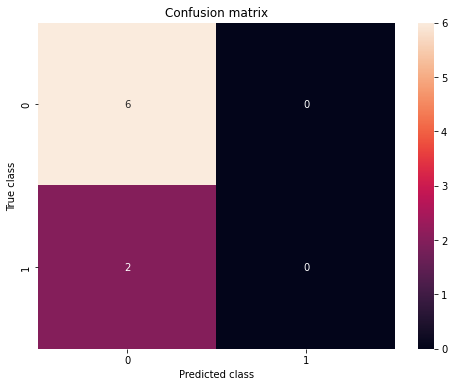

In [104]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred_lr = lr_opt_lw.predict(X_lw_test)

conf_matrix = confusion_matrix(Y_lw_test, y_pred_lr, labels=[0, 1])
plt.figure(figsize=[8, 6])
sns.heatmap(conf_matrix,
            annot=True,
            fmt='d')
plt.title('Confusion matrix')
plt.ylabel('True class')
plt.xlabel('Predicted class');

Parece que siempre predicen la clase "pausa" (0), tanto este modelo como el anterior, tenemos un problema. Necesitamos muchos más datos. 

In [107]:
import numpy as np

n_channel = 3
test_channel = channels_list_df_little_windows[n_channel]
test_no_label = test_channel.drop(['label'], axis=1)
#n_window = 4
#test_window = np.array(test_no_label.iloc[n_window]).reshape(1, 1280)
test_window = test_no_label

print(test_window.shape)

# other channel, window with label to test predict label 1 (jaw)
lr_opt_lw.predict(test_window)

(32, 640)


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 0])

Aquí parece que predice alguno

In [111]:
# guardamos el modelo

# Saving model
filename = 'channel'+ str(n_channel) + 'two_and_a_half_seconds_windows_rubert_jaw_regression.sav'
pickle.dump(lr_opt_lw, open(filename, 'wb'))